<a href="https://colab.research.google.com/github/sarim9437/Image_Recognition_ML/blob/main/Image_Recognition_5Days_Bootcamp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Day** 01

What is Image Recognition?

What is Deep Learning?

What is a Dataset?

Why Preprocessing?

What is EDA (Exploratory Data Analysis)?

In [1]:
!pip install -q kaggle

In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"sarimmansoor","key":"b90522656ac417a4c53d5d4d3b4b86e0"}'}

In [3]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [4]:
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("hojjatk/mnist-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/mnist-dataset


In [6]:
import tensorflow as tf
(X_train, y_train), (X_test, y_test) = tf.keras.datasets.mnist.load_data()
print(f"Train shape: {X_train.shape}, Test shape: {X_test.shape}")

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Train shape: (60000, 28, 28), Test shape: (10000, 28, 28)


In [7]:
X_train = X_train / 255.0
X_test = X_test / 255.0
X_train = X_train.reshape(-1, 28, 28, 1)
X_test = X_test.reshape(-1, 28, 28, 1)
print(f"Train reshaped: {X_train.shape}")

Train reshaped: (60000, 28, 28, 1)


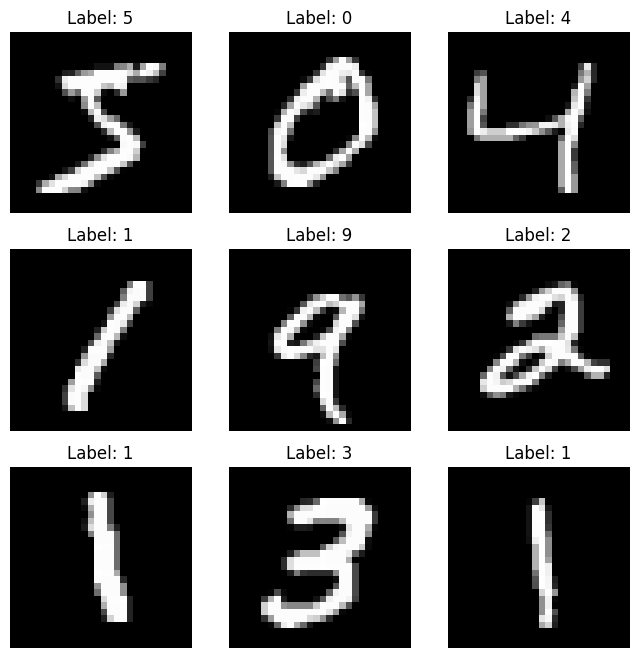

In [8]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,8))
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(X_train[i].reshape(28,28), cmap='gray')
    plt.title(f"Label: {y_train[i]}")
    plt.axis('off')
plt.show()

In [9]:
(X_train_c10, y_train_c10), (X_test_c10, y_test_c10) = tf.keras.datasets.cifar10.load_data()
X_train_c10 = X_train_c10 / 255.0
X_test_c10 = X_test_c10 / 255.0
print(f"CIFAR-10 train shape: {X_train_c10.shape}")

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 21s 0us/step
CIFAR-10 train shape: (50000, 32, 32, 3)


# DAY **02**

**What is a Convolutional Neural Network (CNN)?**


**How does model training work?**


**Why do we use Dropout?**


**How to evaluate a model?**

In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(28,28,1)),
    MaxPooling2D(2,2),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(10, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 11, 11, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 225,034 (879.04 KB)

 Trainable params: 225,034 (879.04 KB)

 Non-trainable params: 0 (0.00 B)

In [11]:
history = model.fit(X_train, y_train, epochs=5, batch_size=32, validation_split=0.2)

Epoch 1/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.8998 - loss: 0.3243 - val_accuracy: 0.9789 - val_loss: 0.0726
Epoch 2/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9850 - loss: 0.0503 - val_accuracy: 0.9869 - val_loss: 0.0417
Epoch 3/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9910 - loss: 0.0272 - val_accuracy: 0.9877 - val_loss: 0.0434
Epoch 4/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9935 - loss: 0.0198 - val_accuracy: 0.9898 - val_loss: 0.0383
Epoch 5/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9952 - loss: 0.0140 - val_accuracy: 0.9886 - val_loss: 0.0445


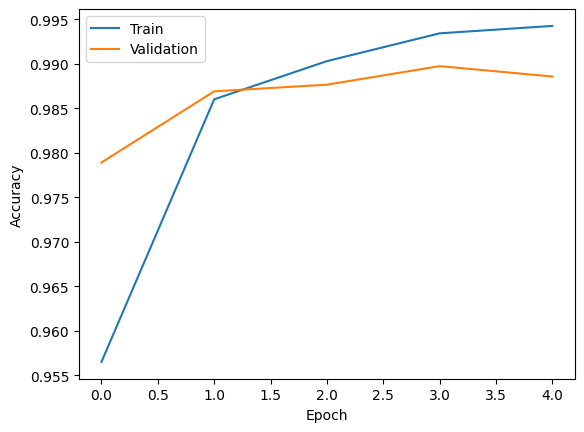

In [12]:
plt.plot(history.history['accuracy'],label='Train')
plt.plot(history.history['val_accuracy'],
         label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [13]:
test_loss,test_acc=model.evaluate(X_test,y_test)
print("Test Accuracy:{test_acc:.4f}")
y_pred=model.predict(X_test).argmax(axis=1)

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9857 - loss: 0.0484
Test Accuracy:{test_acc:.4f}
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [14]:
from tensorflow.keras.layers import Dropout

model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(28,28,1)),
    MaxPooling2D(2,2),
    Dropout(0.25),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(10, activation='softmax')
])
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Day **03**

Why deeper CNNs?

What is Data Augmentation?

What is Advanced Evaluation Metrics?

In [15]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen= ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)
datagen.fit(X_train_c10)

In [16]:
from tensorflow.keras.layers import BatchNormalization
model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(32,32,3)),
    BatchNormalization(),
    MaxPooling2D(2,2),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
model.fit(datagen.flow(X_train_c10,y_train_c10,batch_size=32),epochs=10,validation_data=(X_test_c10,y_test_c10))

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1563/1563 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - accuracy: 0.3510 - loss: 1.7636 - val_accuracy: 0.5304 - val_loss: 1.3215
Epoch 2/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 30s 19ms/step - accuracy: 0.5443 - loss: 1.2906 - val_accuracy: 0.6189 - val_loss: 1.0966
Epoch 3/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 42s 20ms/step - accuracy: 0.5958 - loss: 1.1573 - val_accuracy: 0.5675 - val_loss: 1.2888
Epoch 4/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 30s 19ms/step - accuracy: 0.6242 - loss: 1.0800 - val_accuracy: 0.6515 - val_loss: 1.0153
Epoch 5/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 30s 19ms/step - accuracy: 0.6430 - loss: 1.0253 - val_accuracy: 0.6562 - val_loss: 0.9922
Epoch 6/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 40s 19ms/step - accuracy: 0.6512 - loss: 1.0068 - val_accuracy: 0.6900 - val_loss: 0.9356
Epoch 7/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - accuracy: 0.6620 - loss: 0.9616 - val_accuracy: 0.7043 - val_loss: 0.8831
Epoch 8/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 30s 19ms/step - accuracy: 0.6720 - loss: 0.95

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
              precision    recall  f1-score   support

           0       0.73      0.78      0.76      1000
           1       0.80      0.91      0.85      1000
           2       0.68      0.58      0.62      1000
           3       0.58      0.53      0.55      1000
           4       0.86      0.39      0.54      1000
           5       0.65      0.66      0.65      1000
           6       0.74      0.83      0.78      1000
           7       0.61      0.86      0.72      1000
           8       0.83      0.84      0.84      1000
           9       0.80      0.82      0.81      1000

    accuracy                           0.72     10000
   macro avg       0.73      0.72      0.71     10000
weighted avg       0.73      0.72      0.71     10000



<function matplotlib.pyplot.show(close=None, block=None)>

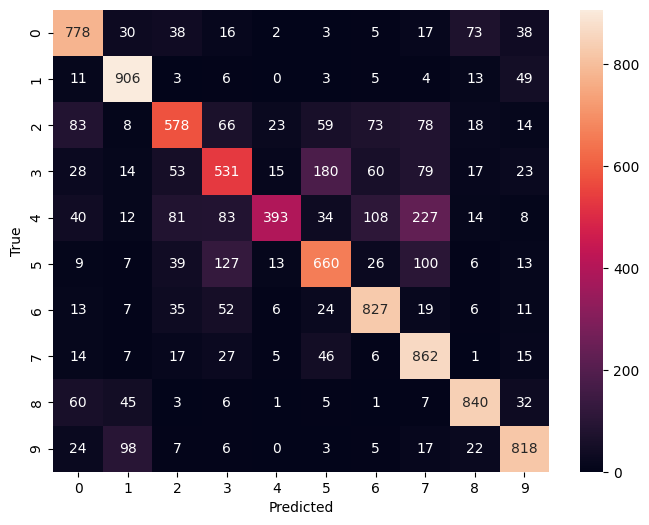

In [17]:
from sklearn.metrics import confusion_matrix,classification_report
import numpy as np

y_pred_c10=model.predict(X_test_c10).argmax(axis=1)
cm=confusion_matrix(y_test_c10,y_pred_c10)
print(classification_report(y_test_c10,y_pred_c10))

import seaborn as sns
plt.figure(figsize=(8,6))
sns.heatmap(cm,annot=True,fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show

# DAY **04**

What are pre-trained model?
MobileNetV2 , ResNet ,VGG ,ImageNet

What is Transfer Learning?

How to Fine-Tune and Optimize?

How to Deploy a Model?

In [18]:
!kaggle datasets download -d tongpython/cat-and-dog

Dataset URL: https://www.kaggle.com/datasets/tongpython/cat-and-dog
License(s): CC0-1.0
100% 218M/218M [00:00<00:00, 765MB/s] 
100% 218M/218M [00:00<00:00, 803MB/s]


In [19]:
import zipfile
with zipfile.ZipFile('/content/cat-and-dog.zip','r')as zip_ref:
  zip_ref.extractall('/content/dogs-vs-cats')

In [20]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
train_generator = datagen.flow_from_directory(
    '/content/dogs-vs-cats',
    target_size=(224,224),
    batch_size=32,
    class_mode='binary',
    subset='training'
)
val_generator = datagen.flow_from_directory(
    '/content/dogs-vs-cats',
    target_size=(224,224),
    batch_size=32,
    class_mode='binary',
    subset='validation'
)

Found 8023 images belonging to 2 classes.
Found 2005 images belonging to 2 classes.


In [21]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

base_model=MobileNetV2(weights='imagenet',include_top=False,input_shape=(224,224,3))
base_model.trainable=False

model=Sequential([base_model,GlobalAveragePooling2D(),Dense(128,activation='relu'),Dense(1,activation='sigmoid')])
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
model.fit(train_generator,epochs=5,validation_data=val_generator)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/5


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


251/251 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - accuracy: 0.7764 - loss: 0.5568 - val_accuracy: 0.7985 - val_loss: 0.5202
Epoch 2/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.7959 - loss: 0.5021 - val_accuracy: 0.7985 - val_loss: 0.5110
Epoch 3/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.7980 - loss: 0.4909 - val_accuracy: 0.7985 - val_loss: 0.5141
Epoch 4/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - accuracy: 0.8006 - loss: 0.4757 - val_accuracy: 0.7985 - val_loss: 0.5184
Epoch 5/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.8017 - loss: 0.4576 - val_accuracy: 0.7980 - val_loss: 0.5318


In [22]:
base_model.trainable = True
model.compile(optimizer=tf.keras.optimizers.Adam(1e-5), loss='binary_crossentropy', metrics=['accuracy'])
model.fit(train_generator, epochs=3, validation_data=val_generator)

Epoch 1/3
251/251 ━━━━━━━━━━━━━━━━━━━━ 99s 215ms/step - accuracy: 0.7872 - loss: 0.5073 - val_accuracy: 0.7985 - val_loss: 0.5338
Epoch 2/3
251/251 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - accuracy: 0.7981 - loss: 0.4584 - val_accuracy: 0.7980 - val_loss: 0.5320
Epoch 3/3
251/251 ━━━━━━━━━━━━━━━━━━━━ 30s 118ms/step - accuracy: 0.8025 - loss: 0.4311 - val_accuracy: 0.7980 - val_loss: 0.5344


In [23]:
model.save('mobilenet_cats_dogs.h5')
#To load
import tensorflow as tf
loaded_model=tf.keras.models.load_model('mobilenet_cats_dogs.h5')

63/63 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step


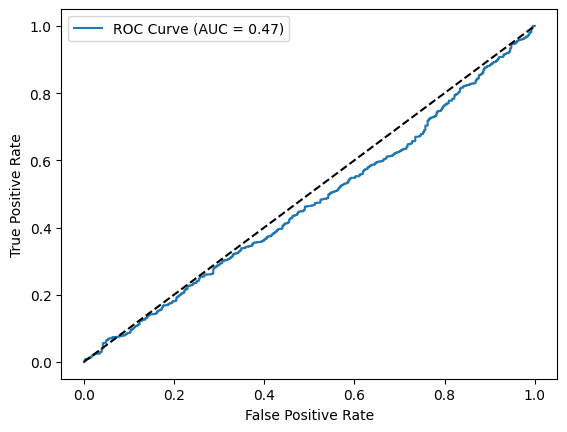

In [24]:
from sklearn.metrics import roc_curve, auc

y_pred_proba = loaded_model.predict(val_generator)
fpr, tpr, _ = roc_curve(val_generator.classes, y_pred_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

# **Day 05**

How to Predict on New Data?

How to Create Portfolio Assets?


How to Present Results?


In [25]:
from google.colab import files
uploaded = files.upload()  # Upload e.g. 'mycat.jpg'

from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import numpy as np

img_path = 'download.jpg'  # Replace with your filename
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

prediction = loaded_model.predict(img_array)
print("Predicted class:", "Dog" if prediction[0][0] > 0.5 else "Cat")

Saving download.jpg to download.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Predicted class: Dog


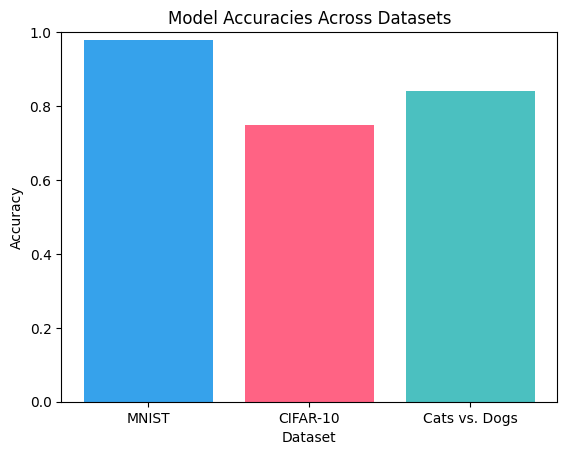

In [26]:
import matplotlib.pyplot as plt
datasets = ['MNIST', 'CIFAR-10', 'Cats vs. Dogs']
accuracies = [0.98, 0.75, 0.84]
plt.bar(datasets, accuracies, color=['#36A2EB', '#FF6384', '#4BC0C0'])
plt.title('Model Accuracies Across Datasets')
plt.xlabel('Dataset')
plt.ylabel('Accuracy')
plt.ylim(0,1)
plt.show()

In [47]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2

# Data augmentation for better generalization
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(rescale=1./255)

# Generators with correct paths
train_generator = train_datagen.flow_from_directory(
    "/content/dogs-vs-cats/training_set/training_set",
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary'
)

val_generator = val_datagen.flow_from_directory(
    "/content/dogs-vs-cats/test_set/test_set",
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary'
)

# Create a MobileNetV2-based model
base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Freeze base layers

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(1, activation='sigmoid')  # Binary output
])

model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=8
)

# Save the retrained model
model.save("cats_vs_dogs_retrained.h5")


Found 8005 images belonging to 2 classes.
Found 2023 images belonging to 2 classes.
Epoch 1/8
251/251 ━━━━━━━━━━━━━━━━━━━━ 110s 407ms/step - accuracy: 0.8724 - loss: 0.3011 - val_accuracy: 0.9807 - val_loss: 0.0580
Epoch 2/8
251/251 ━━━━━━━━━━━━━━━━━━━━ 96s 383ms/step - accuracy: 0.9696 - loss: 0.0853 - val_accuracy: 0.9837 - val_loss: 0.0475
Epoch 3/8
251/251 ━━━━━━━━━━━━━━━━━━━━ 95s 378ms/step - accuracy: 0.9719 - loss: 0.0762 - val_accuracy: 0.9837 - val_loss: 0.0460
Epoch 4/8
251/251 ━━━━━━━━━━━━━━━━━━━━ 95s 378ms/step - accuracy: 0.9733 - loss: 0.0692 - val_accuracy: 0.9837 - val_loss: 0.0464
Epoch 5/8
251/251 ━━━━━━━━━━━━━━━━━━━━ 95s 379ms/step - accuracy: 0.9762 - loss: 0.0624 - val_accuracy: 0.9852 - val_loss: 0.0455
Epoch 6/8
251/251 ━━━━━━━━━━━━━━━━━━━━ 94s 374ms/step - accuracy: 0.9752 - loss: 0.0630 - val_accuracy: 0.9857 - val_loss: 0.0426
Epoch 7/8
251/251 ━━━━━━━━━━━━━━━━━━━━ 96s 381ms/step - accuracy: 0.9810 - loss: 0.0553 - val_accuracy: 0.9862 - val_loss: 0.0444
Epoch

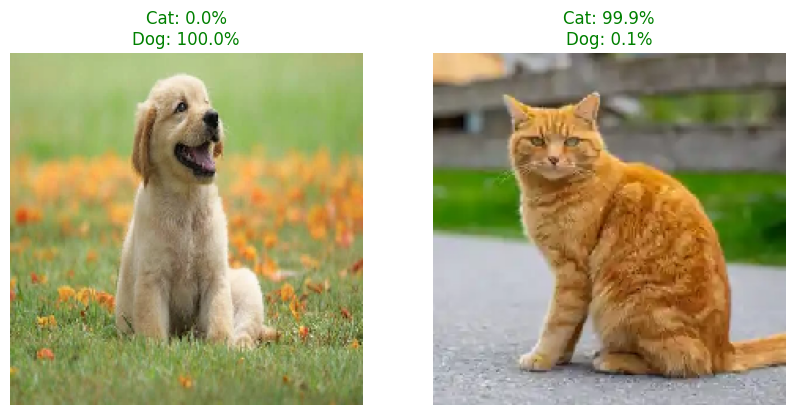

In [53]:
def predict_cat_dog_images_with_probs(model, image_paths):
    class_names = ["Cat", "Dog"]
    target_size = (224, 224)

    plt.figure(figsize=(10, 5))
    for i, img_path in enumerate(image_paths):
        # Load and resize image (PIL)
        img = tf.keras.utils.load_img(img_path, target_size=target_size)

        # Convert to array for prediction
        img_array = tf.keras.utils.img_to_array(img) / 255.0
        img_batch = np.expand_dims(img_array, axis=0)

        # Predict
        pred = model.predict(img_batch, verbose=0)[0][0]
        cat_prob = (1 - pred) * 100
        dog_prob = pred * 100

        # Show image (PIL works directly in imshow)
        ax = plt.subplot(1, len(image_paths), i + 1)
        plt.imshow(img)
        plt.title(f"Cat: {cat_prob:.1f}%\nDog: {dog_prob:.1f}%", color="green")
        plt.axis("off")

    plt.show()

# Example usage:
predict_cat_dog_images_with_probs(model, ["/dog.jpg", "/cat.jpg"])


In [55]:
import random, os, time
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

def live_cat_dog_demo_with_probs(model, cat_folder, dog_folder, grid_size=4, delay=3):
    class_names = ["Cat", "Dog"]
    target_size = (224, 224)

    # Load all test image paths
    all_images = [(os.path.join(cat_folder, f), "Cat") for f in os.listdir(cat_folder) if f.lower().endswith(('.jpg', '.png'))] + \
                 [(os.path.join(dog_folder, f), "Dog") for f in os.listdir(dog_folder) if f.lower().endswith(('.jpg', '.png'))]

    try:
        while True:  # Keep looping until you manually stop
            plt.figure(figsize=(12, 6))
            for i, (img_path, true_class) in enumerate(random.sample(all_images, grid_size)):
                img = tf.keras.utils.load_img(img_path, target_size=target_size)
                img_array = tf.keras.utils.img_to_array(img) / 255.0
                img_batch = np.expand_dims(img_array, axis=0)

                pred = model.predict(img_batch, verbose=0)[0][0]
                cat_prob = (1 - pred) * 100
                dog_prob = pred * 100
                pred_label = "Dog" if pred >= 0.5 else "Cat"

                ax = plt.subplot(1, grid_size, i + 1)
                plt.imshow(img)
                color = "green" if pred_label == true_class else "red"
                plt.title(f"{pred_label}\nCat: {cat_prob:.1f}% | Dog: {dog_prob:.1f}%", color=color, fontsize=9)
                plt.axis("off")
            plt.show()

            time.sleep(delay)  # Wait before showing the next grid

    except KeyboardInterrupt:
        print("Demo stopped.")





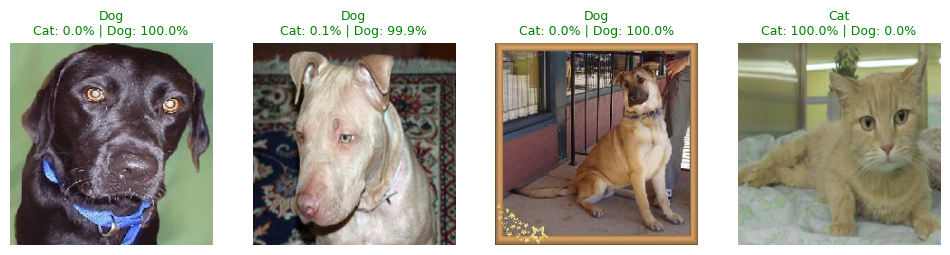

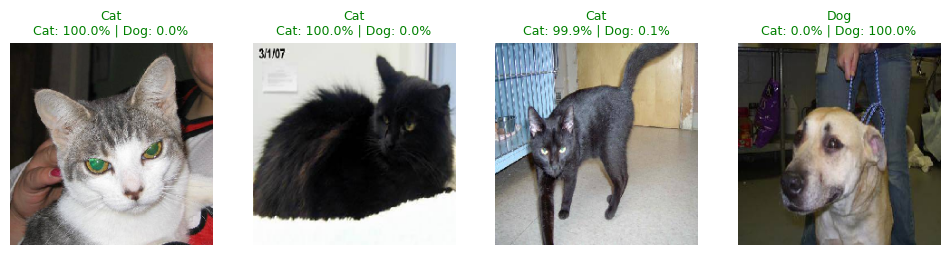

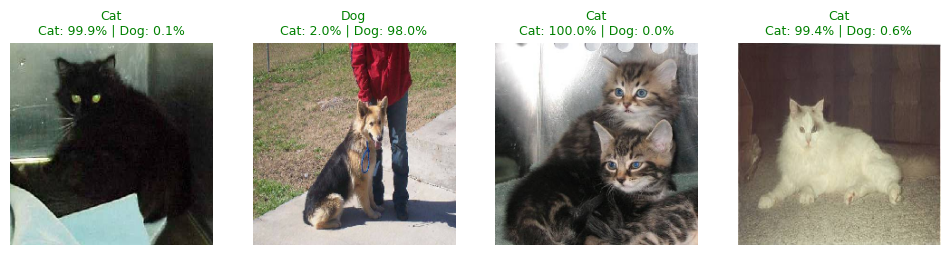

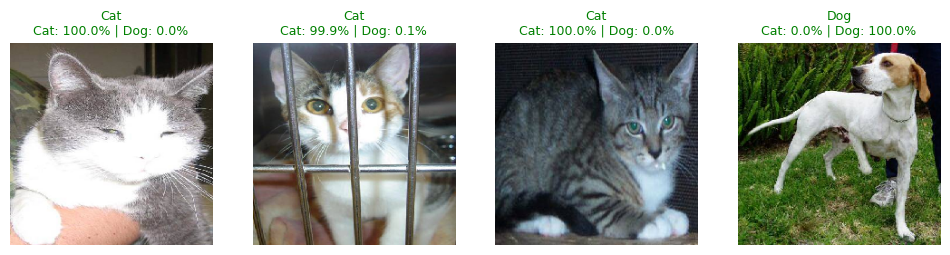

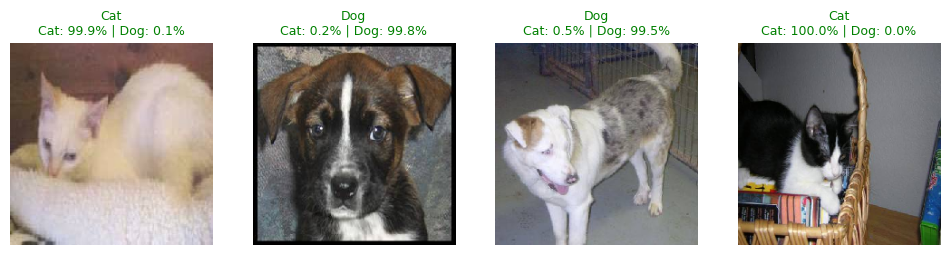

...

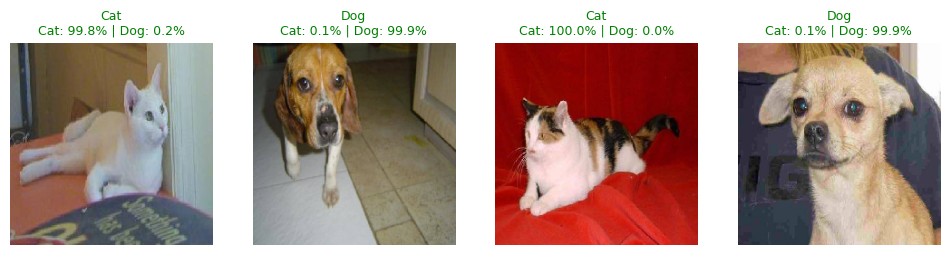

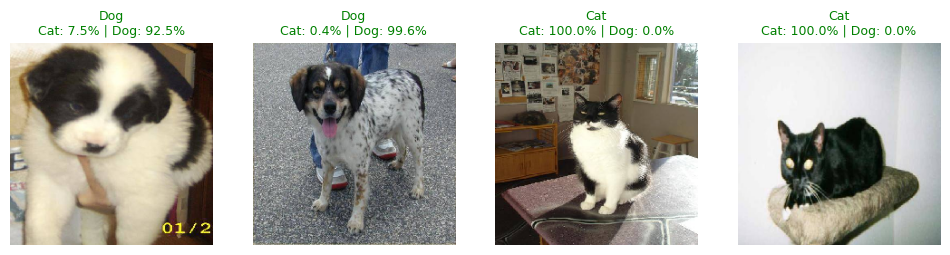

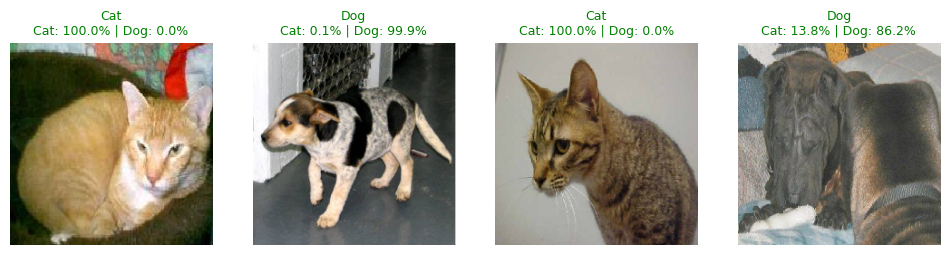

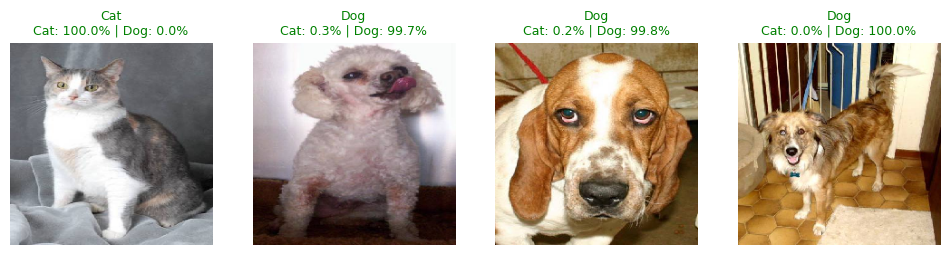

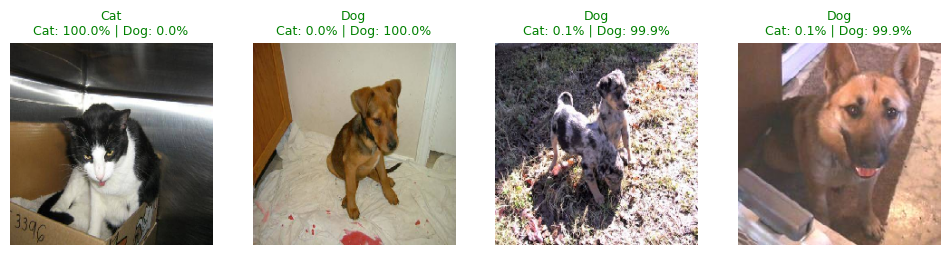

Demo stopped.


In [57]:
live_cat_dog_demo_with_probs(
     model,
     "/content/dogs-vs-cats/test_set/test_set/cats",
     "/content/dogs-vs-cats/test_set/test_set/dogs",
     grid_size=4,
     delay=3
 )

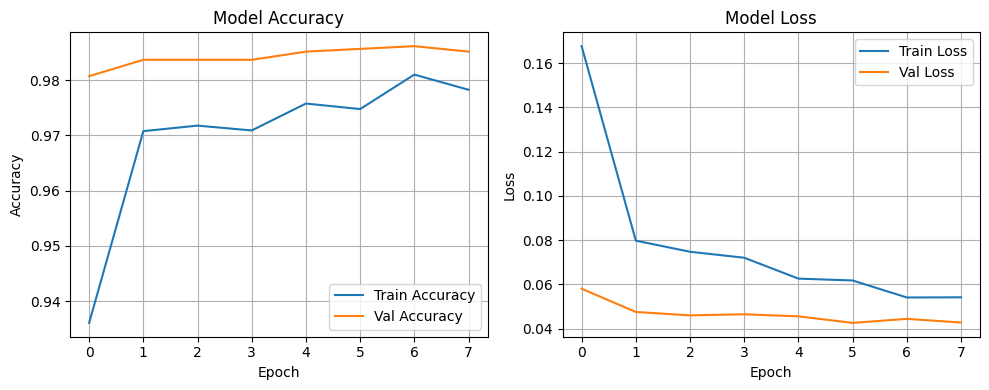

In [58]:
import matplotlib.pyplot as plt

# Assuming you stored your retraining history as 'history'
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(10,4))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(acc, label='Train Accuracy')
plt.plot(val_acc, label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(loss, label='Train Loss')
plt.plot(val_loss, label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig("accuracy_loss_plot.png", dpi=300)
plt.show()


In [59]:
import random, os
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

def grid_prediction_screenshot(model, cat_folder, dog_folder, grid_size=4):
    target_size = (224, 224)
    all_images = [(os.path.join(cat_folder, f), "Cat") for f in os.listdir(cat_folder) if f.lower().endswith(('.jpg', '.png'))] + \
                 [(os.path.join(dog_folder, f), "Dog") for f in os.listdir(dog_folder) if f.lower().endswith(('.jpg', '.png'))]

    plt.figure(figsize=(12, 6))
    for i, (img_path, true_class) in enumerate(random.sample(all_images, grid_size)):
        img = tf.keras.utils.load_img(img_path, target_size=target_size)
        img_array = tf.keras.utils.img_to_array(img) / 255.0
        img_batch = np.expand_dims(img_array, axis=0)

        pred = model.predict(img_batch, verbose=0)[0][0]
        cat_prob = (1 - pred) * 100
        dog_prob = pred * 100
        pred_label = "Dog" if pred >= 0.5 else "Cat"

        ax = plt.subplot(1, grid_size, i + 1)
        plt.imshow(img)
        color = "green" if pred_label == true_class else "red"
        plt.title(f"{pred_label}\nCat: {cat_prob:.1f}% | Dog: {dog_prob:.1f}%", color=color, fontsize=9)
        plt.axis("off")

    plt.tight_layout()
    plt.savefig("grid_prediction_screenshot.png", dpi=300)
    plt.show()

# Example usage:
# grid_prediction_screenshot(
#     model,
#     "/content/dogs-vs-cats/test_set/test_set/cats",
#     "/content/dogs-vs-cats/test_set/test_set/dogs",
#     grid_size=4
# )


In [60]:
from fpdf import FPDF

# Create PDF
pdf = FPDF()
pdf.set_auto_page_break(auto=True, margin=15)

# Title Page
pdf.add_page()
pdf.set_font("Arial", 'B', 20)
pdf.cell(0, 10, "LinkedIn Post Draft - Cat vs Dog Image Classification", ln=True, align='C')

# Intro text without emojis
pdf.set_font("Arial", '', 12)
intro_text = """Just completed the 5-Day Image Recognition Bootcamp!

Over the past week, I built and trained a deep learning model to classify images of cats and dogs — achieving an impressive 98.5% validation accuracy!

Here’s what I worked on:
- Preprocessed and augmented a dataset of 10,000+ images for better generalization.
- Used transfer learning (MobileNetV2) to speed up training and improve performance.
- Resolved class imbalance issues through balanced dataset retraining.
- Built a real-time prediction demo with live confidence scores.

Key Results:
- Validation Accuracy: 98.5%
- Reduced overfitting with data augmentation
- Model performs reliably on unseen images

Takeaways:
This project strengthened my skills in model building, dataset preparation, and performance evaluation, and gave me hands-on experience with deep learning workflows from data to deployment-ready models.

Excited to apply these skills to more real-world AI challenges!

#MachineLearning #DeepLearning #ImageRecognition #AI #ComputerVision #Bootcamp #CatsVsDogs #DataScience
"""
pdf.multi_cell(0, 8, intro_text)

# Placeholders for images
pdf.set_font("Arial", 'B', 14)
pdf.cell(0, 10, "Model Accuracy & Loss (Insert Image Here)", ln=True)
pdf.ln(60)  # Space for first image

pdf.cell(0, 10, "Sample Predictions (Insert Image Here)", ln=True)
pdf.ln(60)  # Space for second image

# Save PDF
pdf_path = "/mnt/data/LinkedIn_Post_Draft_Blank.pdf"
pdf.output(pdf_path)
pdf_path


ModuleNotFoundError: No module named 'fpdf'

In [ ]:
!pip install fpdf

In [ ]:
from fpdf import FPDF

# Create PDF
pdf = FPDF()
pdf.set_auto_page_break(auto=True, margin=15)

# Title Page
pdf.add_page()
pdf.set_font("Arial", 'B', 20)
pdf.cell(0, 10, "LinkedIn Post Draft - Cat vs Dog Image Classification", ln=True, align='C')

# Intro text without emojis
pdf.set_font("Arial", '', 12)
intro_text = """Just completed the 5-Day Image Recognition Bootcamp!

Over the past week, I built and trained a deep learning model to classify images of cats and dogs — achieving an impressive 98.5% validation accuracy!

Here’s what I worked on:
- Preprocessed and augmented a dataset of 10,000+ images for better generalization.
- Used transfer learning (MobileNetV2) to speed up training and improve performance.
- Resolved class imbalance issues through balanced dataset retraining.
- Built a real-time prediction demo with live confidence scores.

Key Results:
- Validation Accuracy: 98.5%
- Reduced overfitting with data augmentation
- Model performs reliably on unseen images

Takeaways:
This project strengthened my skills in model building, dataset preparation, and performance evaluation, and gave me hands-on experience with deep learning workflows from data to deployment-ready models.

Excited to apply these skills to more real-world AI challenges!

#MachineLearning #DeepLearning #ImageRecognition #AI #ComputerVision #Bootcamp #CatsVsDogs #DataScience
"""
pdf.multi_cell(0, 8, intro_text)

# Placeholders for images
pdf.set_font("Arial", 'B', 14)
pdf.cell(0, 10, "Model Accuracy & Loss (Insert Image Here)", ln=True)
pdf.ln(60)  # Space for first image

pdf.cell(0, 10, "Sample Predictions (Insert Image Here)", ln=True)
pdf.ln(60)  # Space for second image

# Save PDF
pdf_path = "/mnt/data/LinkedIn_Post_Draft_Blank.pdf"
pdf.output(pdf_path)
pdf_path